In [13]:
## Define functions

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import LSTM, Linear
from torch_geometric.nn import GATConv
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import wandb

torch.cuda.empty_cache()

def prepare_time_series_data(df, sequence_length):
    """
    Prepare time series data for the LSTM model.
    """
    n_timesteps, n_grids, n_features = df.shape

    X = np.zeros((n_timesteps - sequence_length, sequence_length, n_grids, n_features))
    y = np.zeros((n_timesteps - sequence_length, n_grids, n_features))

    for i in range(n_timesteps - sequence_length):
        X[i] = df[i:i+sequence_length]
        y[i] = df[i+sequence_length]

    return X, y

class LogCoshLoss(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, y_t, y_prime_t):
        # ey_t1 = y_t[:, :, 0] - y_prime_t[:, :, 0]  # Shape: [batch_size, num_nodes]
        # ey_t2 = y_t[:, :, 1] - y_prime_t[:, :, 1]  # Shape: [batch_size, num_nodes]
        
        # # Unsqueeze to add a dimension for concatenation along the last axis
        # ey_t1 = 1*ey_t1.unsqueeze(-1)  # Shape: [batch_size, num_nodes, 1]
        # ey_t2 = 7*ey_t2.unsqueeze(-1)  # Shape: [batch_size, num_nodes, 1]
        
        # # Concatenate along the last axis (dimension 2)
        # ey_t = torch.cat((ey_t1, ey_t2), dim=-1)
        ey_t = y_t - y_prime_t
        return torch.mean(torch.log(torch.cosh(ey_t + 1e-12)))

# class SpatioTemporalGATLSTM(torch.nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels, gat_heads, lstm_layers, sequence_length):
#         super().__init__()
#         self.in_channels = in_channels
#         self.hidden_channels = hidden_channels
#         self.out_channels = out_channels
#         self.gat_heads = gat_heads
#         self.sequence_length = sequence_length

#         self.gat1 = GATConv(in_channels, hidden_channels, heads=gat_heads, dropout=0.5)
#         self.gat2 = GATConv(hidden_channels * gat_heads, hidden_channels, heads=gat_heads, dropout=0.5)
#         self.lstm = LSTM(hidden_channels * gat_heads, hidden_channels, num_layers=lstm_layers, batch_first=True)
#         self.linear = Linear(hidden_channels, out_channels)

#     def forward(self, x, edge_index):
#         # x shape: [batch_size, sequence_length, num_nodes, in_channels]
#         num_samples, seq_len, num_nodes, _ = x.size()

#         # Initialize a list to store GAT outputs for each time step
#         gat_outputs = []

#         # Process each time step independently through the GATConv layer
#         for t in range(seq_len):
#             xt = x[:, t, :]  # Shape: [batch_size, num_nodes, in_channels]
#             xt = xt.reshape(num_samples * num_nodes, self.in_channels)  # Flatten the batch and nodes

#             # Apply GAT
#             xt = self.gat1(xt, edge_index)  # Shape: [batch_size * num_nodes, hidden_channels * gat_heads]
#             xt = F.elu(xt)

#             xt = self.gat2(xt, edge_index)
#             xt = F.elu(xt)

#             # Reshape back to [batch_size, num_nodes, hidden_channels * gat_heads]
#             xt = xt.view(num_samples, num_nodes, -1)
#             gat_outputs.append(xt)

#         # Stack the GAT outputs along the time dimension
#         x = torch.stack(gat_outputs, dim=1)  # Shape: [batch_size, sequence_length, num_nodes, hidden_channels * gat_heads]

#         # Prepare for LSTM
#         x = x.permute(0, 2, 1, 3).contiguous()  # Shape: [batch_size, num_nodes, sequence_length, hidden_channels * gat_heads]
#         x = x.view(num_samples * num_nodes, seq_len, -1)  # Shape: [batch_size * num_nodes, sequence_length, hidden_channels * gat_heads]

#         # Apply LSTM
#         x, _ = self.lstm(x)

#         # Take the last output of LSTM
#         x = x[:, -1, :]  # Shape: [batch_size * num_nodes, hidden_channels]

#         # Apply final linear layer
#         x = self.linear(x)  # Shape: [batch_size * num_nodes, out_channels]

#         # Reshape back to [batch_size, num_nodes, out_channels]
#         x = x.view(num_samples, num_nodes, -1)

#         return x

# class SpatioTemporalGATLSTM(torch.nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels, gat_heads, lstm_layers, sequence_length):
#         super().__init__()
#         self.lstm = LSTM(in_channels, hidden_channels, num_layers=lstm_layers, batch_first=True)
#         self.linear = Linear(hidden_channels, out_channels)

#     def forward(self, x, edge_index):
#         num_samples, seq_len, num_nodes, _ = x.size()
#         x = x.permute(0, 2, 1, 3).contiguous()
#         x = x.view(num_samples * num_nodes, seq_len, -1)

#         x, _ = self.lstm(x)
#         x = x[:, -1, :]
#         x = self.linear(x)
#         x = x.view(num_samples, num_nodes, -1)
#         return x

class SpatioTemporalGATLSTM(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, gat_heads, lstm_layers, sequence_length, dropout=0.5):
        super().__init__()
        self.in_channels = in_channels
        self.hidden_channels = hidden_channels
        self.out_channels = out_channels
        self.gat_heads = gat_heads
        self.sequence_length = sequence_length

        # Graph Attention layers
        self.gat1 = GATConv(in_channels, hidden_channels, heads=gat_heads, dropout=dropout)
        self.gat2 = GATConv(hidden_channels * gat_heads, hidden_channels, heads=gat_heads, dropout=dropout)
        
        # LSTM layer
        self.lstm = nn.LSTM(hidden_channels * gat_heads + in_channels, hidden_channels, num_layers=lstm_layers, batch_first=True)

        # Final linear layer
        self.linear = nn.Linear(hidden_channels, out_channels)
        
        # Dropout layer
        self.dropout = nn.Dropout(dropout)

        # Optional normalization layers
        self.batch_norm1 = nn.BatchNorm1d(hidden_channels * gat_heads)
        self.batch_norm2 = nn.BatchNorm1d(hidden_channels * gat_heads)

    def forward(self, x, edge_index):
        # x shape: [batch_size, sequence_length, num_nodes, in_channels]
        num_samples, seq_len, num_nodes, _ = x.size()

        gat_outputs = []
        for t in range(seq_len):
            xt = x[:, t, :]  # Shape: [batch_size, num_nodes, in_channels]
            xt = xt.reshape(num_samples * num_nodes, self.in_channels)  # Flatten batch and nodes

            # Apply GAT layers
            xt_gat = self.gat1(xt, edge_index)
            xt_gat = F.elu(xt_gat)
            xt_gat = self.batch_norm1(xt_gat)  # Apply normalization
            xt_gat = self.dropout(xt_gat)

            xt_gat = self.gat2(xt_gat, edge_index)
            xt_gat = F.elu(xt_gat)
            xt_gat = self.batch_norm2(xt_gat)
            xt_gat = self.dropout(xt_gat)

            # Reshape back to [batch_size, num_nodes, hidden_channels * gat_heads]
            xt_gat = xt_gat.view(num_samples, num_nodes, -1)
            gat_outputs.append(xt_gat)

        # Stack GAT outputs along the time dimension
        gat_out = torch.stack(gat_outputs, dim=1)  # Shape: [batch_size, sequence_length, num_nodes, hidden_channels * gat_heads]

        # Add skip connection (concatenation) from input to LSTM
        x_residual = x.permute(0, 2, 1, 3).contiguous()  # Shape: [batch_size, num_nodes, sequence_length, in_channels]
        gat_out = gat_out.permute(0, 2, 1, 3).contiguous()  # Shape: [batch_size, num_nodes, sequence_length, hidden_channels * gat_heads]
        
        # Concatenate GAT output and residual input
        x_concat = torch.cat([gat_out, x_residual], dim=-1)  # Shape: [batch_size, num_nodes, sequence_length, hidden_channels * gat_heads + in_channels]
        
        # Prepare for LSTM
        x_concat = x_concat.view(num_samples * num_nodes, seq_len, -1)  # Shape: [batch_size * num_nodes, sequence_length, hidden_channels * gat_heads + in_channels]

        # Apply LSTM
        x_lstm, _ = self.lstm(x_concat)
        
        # Take the last output of LSTM
        x_lstm = x_lstm[:, -1, :]  # Shape: [batch_size * num_nodes, hidden_channels]

        # Apply final linear layer
        x_out = self.linear(x_lstm)  # Shape: [batch_size * num_nodes, out_channels]

        # Reshape back to [batch_size, num_nodes, out_channels]
        x_out = x_out.view(num_samples, num_nodes, -1)

        return x_out

def train_epoch(model, data_loader, edge_index, optimizer, device):
    model.train()
    total_loss = 0
    for batch_X, batch_y in data_loader:
        batch_X, batch_y = batch_X.to(device), batch_y.to(device)
        optimizer.zero_grad()
        out = model(batch_X, edge_index.to(device))
        loss = F.smooth_l1_loss(out, batch_y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(data_loader)

def validate(model, data_loader, edge_index, scheduler, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in data_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            out = model(batch_X, edge_index.to(device))
            loss = F.smooth_l1_loss(out, batch_y)
            total_loss += loss.item()
            scheduler.step(total_loss)
    return total_loss / len(data_loader)

def replace_geojson_evi(input_file, output_file, new_values):
    # Load the GeoJSON file
    gdf = gpd.read_file(input_file)

    # Ensure the number of new values matches the number of features
    if len(new_values) != len(gdf):
        raise ValueError("The number of new values must match the number of features in the GeoJSON file.")

    # Replace the values in a specified column (e.g., 'value')
    # If 'value' column doesn't exist, it will be created
    gdf['mean_evi'] = new_values

    # Save the modified GeoJSON to a new file
    gdf.to_file(output_file, driver='GeoJSON')

    print(f"Modified GeoJSON saved to {output_file}")


def replace_geojson_pop(input_file, output_file, new_values):
    # Load the GeoJSON file
    gdf = gpd.read_file(input_file)

    # Ensure the number of new values matches the number of features
    if len(new_values) != len(gdf):
        raise ValueError("The number of new values must match the number of features in the GeoJSON file.")

    # Replace the values in a specified column (e.g., 'value')
    # If 'value' column doesn't exist, it will be created
    gdf['mean_population'] = new_values

    # Save the modified GeoJSON to a new file
    gdf.to_file(output_file, driver='GeoJSON')

    print(f"Modified GeoJSON saved to {output_file}")


In [51]:
## Model training

# Initialize wandb
wandb.init(project="main", name="hamirpur")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

location = 'hamirpur'

# Preparing data
pop_df = pd.read_csv('pop_himachal.csv')
evi_df = pd.read_csv('evi_himachal.csv')
filtered_gdf = gpd.read_file(f'filtered_grids_{location}.geojson')
filtered_grid_ids = filtered_gdf['FID'].tolist()
filtered_grid_ids = list(map(str, filtered_grid_ids))

# Filter the evi_df DataFrame to include only columns that match the filtered grid IDs
df1 = pop_df[filtered_grid_ids]
df2 = evi_df[filtered_grid_ids]


num_rows, num_columns = df2.shape
combined_array = np.zeros((num_rows, num_columns, 2), dtype=np.float32)
combined_array[:, :, 0] = df1.values
combined_array[:, :, 1] = df2.values

print("Shape of the combined array:", combined_array.shape)

X, y = prepare_time_series_data(combined_array, sequence_length=8)
X, y = torch.from_numpy(X).float(), torch.from_numpy(y).float()
print(f'Data Shapes - X: {X.shape}, y: {y.shape}')

edge_index = np.loadtxt(f'edge_index_{location}.txt')
edge_index = torch.tensor(edge_index, dtype=torch.int)
print(f'edge_index shape: {edge_index.shape}')

# Split data into train and validation sets chronologically
total_samples = X.shape[0]
train_size = int(0.9 * total_samples)

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:], y[train_size:]

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)

# Create DataLoaders for batch processing
batch_size = 1  # Adjust this based on your GPU memory
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

num_samples, sequence_length, num_nodes, in_channels = X.size()
hidden_channels, out_channels, lstm_layers, gat_heads = 8, 2, 2, 4
lr, epochs = 0.003, 2000

model = SpatioTemporalGATLSTM(
    in_channels=in_channels,
    hidden_channels=hidden_channels,
    out_channels=out_channels,
    gat_heads=gat_heads,
    lstm_layers=lstm_layers,
    sequence_length=sequence_length
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

# Learning rate scheduler: Reduce LR on plateau
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', 
                                                       factor=0.1, patience=10, 
                                                       threshold=1e-9, verbose=True)

# Log model architecture and hyperparameters
wandb.watch(model)
wandb.config.update({
    "learning_rate": lr,
    "epochs": epochs,
    "batch_size": batch_size,
    "hidden_channels": hidden_channels,
    "lstm_layers": lstm_layers
})

best_val_loss = float('inf')

# Training loop
for epoch in range(1, epochs + 1):
    train_loss = train_epoch(model, train_loader, edge_index, optimizer, device)
    val_loss = validate(model, val_loader, edge_index, scheduler, device)
    print(f'Epoch: {epoch:03d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    # Log metrics to wandb
    wandb.log({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        'learning_rate': lr
    })

    if epoch % 1000 == 0:
      print(f'Epoch: {epoch:03d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
      torch.save(model.state_dict(), f'gat_{location}_{epoch}.pth')

wandb.finish()

Using device: cuda
Shape of the combined array: (19, 1203, 2)
Data Shapes - X: torch.Size([11, 8, 1203, 2]), y: torch.Size([11, 1203, 2])
edge_index shape: torch.Size([2, 10331])
Epoch: 001, Train Loss: 1.2063, Val Loss: 1.2266
Epoch: 002, Train Loss: 1.0954, Val Loss: 1.0795
Epoch: 003, Train Loss: 0.9261, Val Loss: 0.8779
Epoch: 004, Train Loss: 0.7197, Val Loss: 0.6634
Epoch: 005, Train Loss: 0.5186, Val Loss: 0.4793
Epoch: 006, Train Loss: 0.3834, Val Loss: 0.3816
Epoch: 007, Train Loss: 0.3068, Val Loss: 0.3228
Epoch: 008, Train Loss: 0.2638, Val Loss: 0.2882
Epoch: 009, Train Loss: 0.2368, Val Loss: 0.2601
Epoch: 010, Train Loss: 0.2160, Val Loss: 0.2399
Epoch: 011, Train Loss: 0.2007, Val Loss: 0.2279
Epoch: 012, Train Loss: 0.1876, Val Loss: 0.2169
Epoch: 013, Train Loss: 0.1762, Val Loss: 0.2036
Epoch: 014, Train Loss: 0.1659, Val Loss: 0.1941
Epoch: 015, Train Loss: 0.1553, Val Loss: 0.1840
Epoch: 016, Train Loss: 0.1460, Val Loss: 0.1759
Epoch: 017, Train Loss: 0.1374, Val L

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,2000
learning_rate,0.003
train_loss,0.02223
val_loss,0.04403


In [57]:
## Predicting future time steps

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

location = 'hamirpur'

# Preparing data
pop_df = pd.read_csv('pop_himachal.csv')
evi_df = pd.read_csv('evi_himachal.csv')
filtered_gdf = gpd.read_file(f'filtered_grids_{location}.geojson')
filtered_grid_ids = filtered_gdf['FID'].tolist()
filtered_grid_ids = list(map(str, filtered_grid_ids))

# Filter the evi_df DataFrame to include only columns that match the filtered grid IDs
df1 = pop_df[filtered_grid_ids]
df2 = evi_df[filtered_grid_ids]


num_rows, num_columns = df2.shape
combined_array = np.zeros((num_rows, num_columns, 2), dtype=np.float32)
combined_array[:, :, 0] = df1.values
combined_array[:, :, 1] = df2.values

print("Shape of the combined array:", combined_array.shape)

X, y = prepare_time_series_data(combined_array, sequence_length=6)
X, y = torch.from_numpy(X).float(), torch.from_numpy(y).float()
print(f'Data Shapes - X: {X.shape}, y: {y.shape}')

edge_index = np.loadtxt(f'edge_index_{location}.txt')
edge_index = torch.tensor(edge_index, dtype=torch.int)
print(f'edge_index shape: {edge_index.shape}')


num_samples, sequence_length, num_nodes, in_channels = X.size()
hidden_channels, out_channels, lstm_layers, gat_heads = 8, 2, 2, 4
lr, epochs = 0.003, 800

model = SpatioTemporalGATLSTM(
    in_channels=in_channels,
    hidden_channels=hidden_channels,
    out_channels=out_channels,
    gat_heads=gat_heads,
    lstm_layers=lstm_layers,
    sequence_length=sequence_length
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Learning rate scheduler: Reduce LR on plateau
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', 
                                                       factor=0.1, patience=10, 
                                                       threshold=1e-9, verbose=True)

# Load the saved model from the checkpoint
model.load_state_dict(torch.load(f'gat_{location}_1000.pth', map_location=torch.device(device)))
model.eval()  # Set the model to evaluation mode

# Define the number of future timesteps to predict
future_timesteps = 20

# Assuming the last few timesteps in your data are the input for prediction
# You can take the last `sequence_length` timesteps from your combined data
X_input = X[-10].unsqueeze(0).to(device)  # Adding a batch dimension
print('X_input shape', X_input.shape)
# Initialize an empty list to store predictions
predictions = []

# Generate predictions for the next 20 timesteps
with torch.no_grad():  # No need to compute gradients during inference
    for t in range(future_timesteps):
        out = model(X_input.to(device), edge_index.to(device))
        predictions.append(out.cpu().numpy())  # Store the prediction

        # Update the input by appending the predicted value
        # and removing the oldest timestep from the sequence
        X_input = torch.cat((X_input[:, 1:, :, :], out.unsqueeze(1)), dim=1)

# Convert predictions to a numpy array
predictions = np.array(predictions)

# Print the shape of the predictions
print("Predictions shape:", predictions.shape)

# Optionally, you can save the predictions to a file for further analysis
np.save('predicted_evi_timesteps.npy', predictions)

Shape of the combined array: (19, 1203, 2)
Data Shapes - X: torch.Size([13, 6, 1203, 2]), y: torch.Size([13, 1203, 2])
edge_index shape: torch.Size([2, 10331])
X_input shape torch.Size([1, 6, 1203, 2])
Predictions shape: (20, 1, 1203, 2)


In [58]:
## Save predictions to geojson file
location = 'hamirpur'

input_file = f'filtered_grids_{location}.geojson'

replace_geojson_evi(input_file, f'{location}_evi_2030_06_chunk_0.geojson', predictions[9, :, :, 1][0])
replace_geojson_evi(input_file, f'{location}_evi_2040_06_chunk_0.geojson', predictions[19, :, :, 1][0])

Modified GeoJSON saved to hamirpur_evi_2030_06_chunk_0.geojson
Modified GeoJSON saved to hamirpur_evi_2040_06_chunk_0.geojson


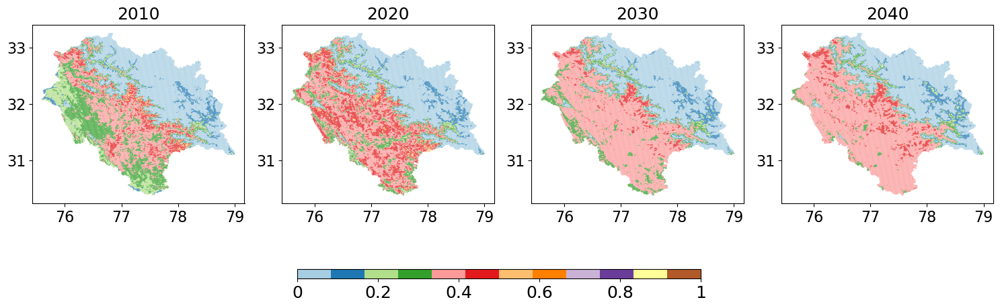

In [26]:
## For evi plot

import geopandas as gpd
import matplotlib.pyplot as plt
import os
from matplotlib import colors

# Directory containing the GeoJSON files
directory = ''

location = 'himachal'

# Get list of GeoJSON files in the directory
geojson_files = ['mean_evi_2010_06_chunk_0.geojson',
                'mean_evi_2020_06_chunk_0.geojson',
                f'{location}_evi_2030_06_chunk_0.geojson',
                f'{location}_evi_2040_06_chunk_0.geojson']

# Path to the filtered GeoJSON file
filtered_geojson_path = os.path.join(directory, f'filtered_grids_{location}.geojson')

# Load the filtered GeoJSON file and extract the grid IDs
filtered_gdf = gpd.read_file(filtered_geojson_path)
filtered_grid_ids = filtered_gdf['FID'].tolist()  # Assumes grid_id is a column

# Number of rows and columns for subplots
n_cols = 4
n_rows = (len(geojson_files) + n_cols - 1) // n_cols  # Ensures enough rows for all files

# Create figure and axes for subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows + 2))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Create a color normalization object for common color range
vmin, vmax = 0, 1  # Adjust this based on the population range
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# Loop through GeoJSON files and plot each
for i, file_name in enumerate(geojson_files):
    file_path = os.path.join(directory, file_name)

    # Load the GeoJSON file into a GeoDataFrame
    gdf = gpd.read_file(file_path)

    # Filter the GeoDataFrame to include only rows with grid IDs in the filtered_grid_ids
    filtered_gdf = gdf[gdf['FID'].isin(filtered_grid_ids)]

    # Plot each filtered GeoDataFrame in the corresponding subplot
    filtered_gdf.plot(column='mean_evi', cmap='Paired', ax=axes[i], norm=norm, aspect='equal')
    axes[i].set_title(file_name.split('_')[2], fontsize=18)

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to ensure even spacing and prevent overlap
plt.tight_layout()

# Add a common colorbar at the bottom with added space
cbar_ax = fig.add_axes([0.3, 0.15, 0.4, 0.02])  # Adjusted for bottom placement
sm = plt.cm.ScalarMappable(cmap='Paired', norm=norm)
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

# Create custom labels (for example, 25 custom labels)
custom_labels = ['0', '0.2', '0.4', '0.6', '0.8', '1']

# Set the custom ticks and labels on the colorbar
num_labels = len(custom_labels)
cbar.set_ticks([vmin + i * (vmax - vmin) / (num_labels - 1) for i in range(num_labels)])  # Set positions
cbar.set_ticklabels(custom_labels, fontsize=18)  # Set the corresponding labels


# Set larger font size for axis labels
for ax in axes:
    ax.tick_params(axis='both', labelsize=16)

# Save the plot as a PDF
plt.savefig(f'evi_{location}.pdf', format='pdf')
plt.show()

In [60]:
# ## Save pop predictions to geojson file
# location = 'hamirpur'

# input_file = f"filtered_grids_{location}.geojson"

# replace_geojson_pop(input_file, f'{location}_population_2030_chunk_0.geojson', predictions[9, :, :, 0][0])
# replace_geojson_pop(input_file, f'{location}_population_2040_chunk_0.geojson', predictions[19, :, :, 0][0])

Modified GeoJSON saved to hamirpur_population_2030_chunk_0.geojson
Modified GeoJSON saved to hamirpur_population_2040_chunk_0.geojson


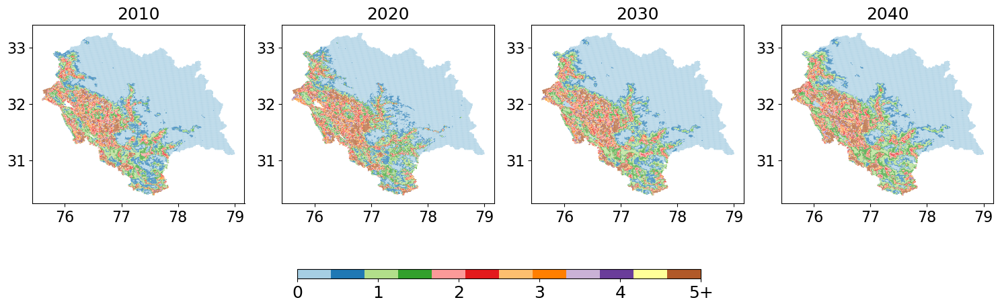

In [27]:
## For pop plot

import geopandas as gpd
import matplotlib.pyplot as plt
import os
from matplotlib import colors

# Directory containing the GeoJSON files
directory = ''

location = 'himachal'

# Get list of GeoJSON files in the directory
geojson_files = ['mean_population_2010_chunk_0.geojson',
                'mean_population_2020_chunk_0.geojson',
                f'{location}_population_2030_chunk_0.geojson',
                f'{location}_population_2040_chunk_0.geojson']

# Path to the filtered GeoJSON file
filtered_geojson_path = os.path.join(directory, f'filtered_grids_{location}.geojson')

# Load the filtered GeoJSON file and extract the grid IDs
filtered_gdf = gpd.read_file(filtered_geojson_path)
filtered_grid_ids = filtered_gdf['FID'].tolist()  # Assumes grid_id is a column

# Number of rows and columns for subplots
n_cols = 4
n_rows = (len(geojson_files) + n_cols - 1) // n_cols  # Ensures enough rows for all files

# Create figure and axes for subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows + 2))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Create a color normalization object for common color range
vmin, vmax = 0, 5  # Adjust this based on the population range
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# Loop through GeoJSON files and plot each
for i, file_name in enumerate(geojson_files):
    file_path = os.path.join(directory, file_name)

    # Load the GeoJSON file into a GeoDataFrame
    gdf = gpd.read_file(file_path)

    # Filter the GeoDataFrame to include only rows with grid IDs in the filtered_grid_ids
    filtered_gdf = gdf[gdf['FID'].isin(filtered_grid_ids)]

    # Plot each filtered GeoDataFrame in the corresponding subplot
    filtered_gdf.plot(column='mean_population', cmap='Paired', ax=axes[i], norm=norm, aspect='equal')
    axes[i].set_title(file_name.split('_')[2], fontsize=18)

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to ensure even spacing and prevent overlap
plt.tight_layout()

# Add a common colorbar at the bottom with added space
cbar_ax = fig.add_axes([0.3, 0.15, 0.4, 0.02])  # Adjusted for bottom placement
sm = plt.cm.ScalarMappable(cmap='Paired', norm=norm)
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

# Create custom labels (for example, 25 custom labels)
custom_labels = ['0', '1', '2', '3', '4', '5+']

# Set the custom ticks and labels on the colorbar
num_labels = len(custom_labels)
cbar.set_ticks([vmin + i * (vmax - vmin) / (num_labels - 1) for i in range(num_labels)])  # Set positions
cbar.set_ticklabels(custom_labels, fontsize=18)  # Set the corresponding labels


# Set larger font size for axis labels
for ax in axes:
    ax.tick_params(axis='both', labelsize=16)

# Save the plot as a PDF
plt.savefig(f'pop_{location}.pdf', format='pdf')
plt.show()

In [3]:
import geopandas as gpd
import plotly.express as px
import os

# Directory containing the GeoJSON files
directory = ''

location = 'hamirpur'

# List of GeoJSON files
geojson_files = ['mean_population_2010_chunk_0.geojson',
                'mean_population_2020_chunk_0.geojson',
                f'{location}_population_2030_chunk_0.geojson',
                f'{location}_population_2040_chunk_0.geojson']

# Path to the filtered GeoJSON file
filtered_geojson_path = os.path.join(directory, f'filtered_grids_{location}.geojson')

# Load the filtered GeoJSON file and extract the grid IDs
filtered_gdf = gpd.read_file(filtered_geojson_path)
filtered_grid_ids = filtered_gdf['FID'].tolist()

# Loop through GeoJSON files and create Plotly subplots
for file_name in geojson_files:
    file_path = os.path.join(directory, file_name)
    gdf = gpd.read_file(file_path)

    # Filter the GeoDataFrame based on grid IDs
    filtered_gdf = gdf[gdf['FID'].isin(filtered_grid_ids)]
    
    # Create an interactive choropleth map using Plotly
    fig = px.choropleth(filtered_gdf, geojson=filtered_gdf.geometry, 
                        locations=filtered_gdf.index, color="mean_population",
                        color_continuous_scale="Viridis", range_color=(0, 5),
                        labels={'mean_population': 'Population'})
    
    fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(title_text=f"Population for {file_name.split('_')[2]}")
    
    # Show interactive plot
    fig.show()


In [2]:
!pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 3.3 MB/s eta 0:00:00m eta 0:00:010:00:01
